In [2]:
# Implementing a U-net network on Bagls dataset.

import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from natsort import natsorted

import keras
from keras.models import *
from keras.layers import *
from keras.optimizers import *

import albumentations as A
from PIL import Image
from sklearn.model_selection import train_test_split

from scipy.ndimage import gaussian_filter


C:\Users\ve59kedo\.conda\envs\HUNet\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.25.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [31]:
data_dir = './Tiles_0.9_256_64'
tile_size1 = (256,256)
tile_size2 = (256,256,1)
input_shape = (256,256,3)

 
x = []
y = []

for filename in natsorted(os.listdir(data_dir)):

    if filename.endswith('labelled.png'):
        y.append(os.path.join(data_dir, filename))
        
    if filename.endswith('].png'):
        x.append(os.path.join(data_dir, filename))   
        

import numpy as np
from PIL import Image

# List to store the paths of images with unique classes
full_set_y = []
full_set_x = []       
counter = 0

# Create a copy of the original 'y' list
y_copy = y.copy()

# Loop through the dataset represented by 'y_copy'
unique_classes_encountered = set()
total_pixels = 256 * 256

for i in range(len(y)):
    lbl_arr_path = y[i]

    # Check if the image contains at least one unique class from 1 to 12
    img = np.array(Image.open(lbl_arr_path))
    unique_classes = np.unique(img)
    unique_classes_1_to_12 = [cls for cls in unique_classes if 1 <= cls <= 12]
    for cls in unique_classes_1_to_12:
        # Append the path to the full_set_y list
        img_clc = (img == cls)

        # Step 1: Count the number of ones using numpy
        num_ones = np.sum(img_clc == 1)

        # Step 2: Calculate percentage
        percentage_ones = (num_ones / total_pixels) * 100.
        if percentage_ones >= 8.0:
            if lbl_arr_path not in full_set_y:
                full_set_y.append(lbl_arr_path)
        else:
            counter += 1

for mask_path in full_set_y:
    # Remove the '-labelled' from the mask path
    image_path = mask_path.replace('-labelled', '')
    full_set_x.append(image_path)         
                   
X_train, X_test, Y_train, Y_test = train_test_split(full_set_x, full_set_y, test_size=0.15, random_state=42)
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.18, random_state=42)

print("Dataset Sizes:")
print(f"killed {counter} unpure samples")
print(f"Training set: {len(X_train)} samples = {((len(X_train)/len(full_set_x))*100):.2f}%")
print(f"Validation set: {len(X_val)} samples = {((len(X_val)/len(full_set_x))*100):.2f}%")
print(f"Test set: {len(X_test)} samples = {((len(X_test)/len(full_set_x))*100):.2f}%")

Dataset Sizes:
killed 12725 unpure samples
Training set: 10745 samples = 69.70%
Validation set: 2359 samples = 15.30%
Test set: 2313 samples = 15.00%


(256, 256) [0 1 2 7]


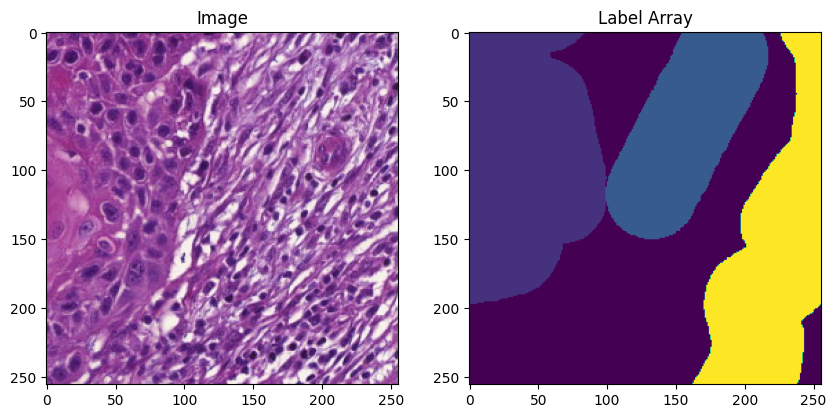

In [17]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(10, 5))  # Create a subplot with two plots side by side

for i in range(len(Y_train)):
    lbl_arr = Image.open(Y_train[i])
    lbl_arr = lbl_arr.resize((256, 256))
    lbl_arr = np.array(lbl_arr)
    if len(np.unique(lbl_arr)) > 3:
        print(np.shape(lbl_arr), np.unique(lbl_arr))
        img = Image.open(X_train[i])
        
        # Plot the image
        axs[0].imshow(img)
        axs[0].set_title("Image")
        
        # Plot the label array
        axs[1].imshow(lbl_arr)
        axs[1].set_title("Label Array")
        
        plt.show()  # Show the plot
        break


In [39]:
class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'

    def __init__(self, list_IDs, list_labels, batch_size=2, shuffle=True, aug=True,num_class=14,remove_bg=0):
        'Initialization'
        self.filter = A.Compose([
            A.HorizontalFlip(p=0.2),
            A.RandomBrightnessContrast(p=0.2),
            A.VerticalFlip(p=0.2),
            A.RandomRotate90(p=0.1)
        ])
        self.class_names = class_names = [
            'Not_annotated',
            'Tumor',
            'Stroma',
            'Necrosis',
            'Verhornung',
            'Blut',
            'Bindegewebe',
            'X2 Stroma',
            'Fettgewebe',
            'Muskel',
            'Cauter',
            'Muskel längss',
            'Nerv',
            'White_BG']
        self.batch_size = batch_size
        self.list_labels = list_labels
        self.list_IDs = list_IDs
        self.shuffle = shuffle
        self.aug = aug
        self.num_class = num_class
        self.remove_bg = remove_bg
        self.unique = np.arange(0, self.num_class, 1)
        if self.remove_bg:
            self.class_names = self.class_names[1:]
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index * self.batch_size: (index + 1) * self.batch_size]

        # Find list of IDs
        list_IDs_paths = [self.list_IDs[k] for k in indexes]
        list_label_paths = [self.list_labels[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_paths, list_label_paths)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_paths, list_label_paths):
        'Generates data containing batch_size samples' # X: (n_samples, *dim, n_channels)
        # Initialization
        x_images = []
        y_images = []

        # Generate data
        for i, (sample_path, label_path) in enumerate(zip(list_IDs_paths, list_label_paths)):
            # Store sample
            img_arr = Image.open(sample_path)
            img_arr = img_arr.resize(tile_size1)
            img_arr = np.array(img_arr, dtype=np.float32)
            img_arr /= 255.0 # normalize

            # Store label
            lbl_arr = Image.open(label_path)
            lbl_arr = lbl_arr.resize(tile_size1)
            lbl_arr = np.array(lbl_arr)
            channels = np.zeros((np.shape(lbl_arr)[0], np.shape(lbl_arr)[1], self.num_class), dtype=np.float32)

            for i, value in enumerate(self.unique):
                channels[:, :, i] = (lbl_arr == value).astype(np.uint8) * 255

            # Apply Gaussian smoothing with a specified sigma (adjust sigma as needed)
            sigma = 8.0
            img_arr_smoothed = gaussian_filter(img_arr, sigma=sigma)

            # Threshold the image to make white pixels more visible
            threshold = 0.8
            img_arr_smoothed = np.mean(img_arr_smoothed,axis=2)
            img_arr_smoothed[img_arr_smoothed >= threshold] = 1.0
            img_arr_smoothed[img_arr_smoothed < threshold] = 0.0

            channels[:,:,-1] = img_arr_smoothed

            for i in range(0, self.num_class - 1):
                if i == 8:
                    overlap = (channels[:, :, i].astype(bool) & img_arr_smoothed.astype(bool)).astype(np.uint8)
                    if np.max(overlap):
                        channels[:, :, -1] = (channels[:, :, i].astype(bool) ^ overlap).astype(np.uint8)
                    continue

                # Perform a bitwise AND operation to get the overlapping region
                overlap = (channels[:, :, i].astype(bool) & img_arr_smoothed.astype(bool)).astype(np.uint8)

                # Perform a bitwise XOR operation to delete the overlapping region from mask1
                channels[:, :, i] = (channels[:, :, i].astype(bool) ^ overlap).astype(np.uint8)

            lbl_arr = channels
            lbl_arr[lbl_arr < 1] = 0
            lbl_arr[lbl_arr >= 1] = 1

            if self.remove_bg:
                lbl_arr = lbl_arr[...,1:]


            if self.aug:
                transformed = self.filter(image=img_arr, mask=lbl_arr)
                x_images.append(transformed['image'])
                y_images.append(transformed['mask'])
            else:
                x_images.append(img_arr)
                y_images.append(lbl_arr)

        # Stack x_images along a new axis
        x_images = np.stack(x_images, axis=0)
        y_images = np.stack(y_images, axis=0)

        return x_images, y_images

    def viz(self, x_images, y_images):
        'Visualizes original and transformed images'
        batch_size = len(x_images)
        for dx in range(batch_size):
            y_mask = y_images[dx]

            # Display original and transformed images side by side
            fig, axs = plt.subplots(1, len(self.class_names)+1, figsize=(20, 10))

            axs[0].imshow(x_images[dx])
            axs[0].set_title('img')
            axs[0].axis('off')

            for i in range(0, len(self.class_names)):
                axs[i+1].imshow(y_mask[:, :, i])
                axs[i+1].axis('off')  # Remove axes
                axs[i+1].set_title(f'{self.class_names[i]}_{i}', fontsize=9)
            plt.show()

        print(f'Batch shape {np.shape(x_images)} and for masks {np.shape(y_images)}')
        print(f'image shape {np.shape(x_images[dx])} and for masks {np.shape(y_images[dx])}')
        print(f'max value for images is {np.max(x_images[dx])} and for masks {np.max(y_images[dx])}')
        print(f'min value for images is {np.min(x_images[dx])} and for masks {np.min(y_images[dx])}')
        print(f'number of unique values in images is {len(np.unique(x_images[dx]))} and for masks {np.unique(y_images[dx])}')
    
    


IndentationError: expected an indented block (3851611302.py, line 160)

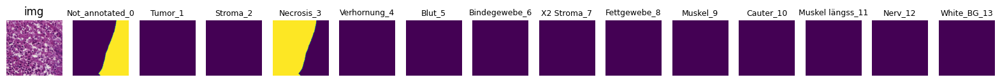

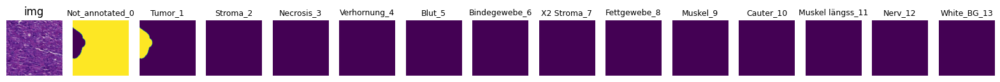

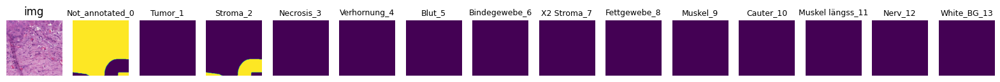

Batch shape (3, 256, 256, 3) and for masks (3, 256, 256, 14)
image shape (256, 256, 3) and for masks (256, 256, 14)
max value for images is 1.0 and for masks 1.0
min value for images is 0.054901961237192154 and for masks 0.0
number of unique values in images is 238 and for masks [0. 1.]


In [42]:
test = DataGenerator(X_train,Y_train,batch_size=3,aug=0)
a,b = test.__getitem__(1)
weight = DataGenerator(X_train,Y_train,batch_size=len(Y_train),aug=0)
wa,wb = weight.__getitem__(0)
test.viz(a,b)

In [44]:
def count_ones_per_channel(mask_list):
    num_channels = mask_list[0].shape[-1]
    result = [0] * num_channels

    for mask in mask_list:
        for channel in range(num_channels):
            result[channel] += np.sum(mask[..., channel])
    class_occurrences = np.array(result)
    class_weights = np.sum(class_occurrences) / (14 * class_occurrences)

    return class_weights

class_weights = count_ones_per_channel(wb)

class_weights[0] = 0.0
print(class_weights)

#[ 0.          0.59198031  1.30321259  2.79301012  3.36147768 23.01366383
# 12.24642511  2.5611076  28.53949286  5.26079142 18.98749463 85.53032634
# 26.01193567  3.99163897]

[ 0.          0.59198031  1.30321259  2.79301012  3.36147768 23.01366383
 12.24642511  2.5611076  28.53949286  5.26079142 18.98749463 85.53032634
 26.01193567  3.99163897]


In [59]:
from tensorflow.keras.layers import Add

fil = 32
inputs = Input(input_shape)

# Contractive
conv1 = Conv2D(fil, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
conv2 = Conv2D(fil, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
conv2 = BatchNormalization()(conv2)
skip1 = Add()([conv1, conv2])
pool1 = MaxPooling2D(pool_size=(2, 2))(skip1)

conv3 = Conv2D(fil * 2, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
conv4 = Conv2D(fil * 2, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
conv4 = BatchNormalization()(conv4)
skip2 = Add()([conv3, conv4])
pool2 = MaxPooling2D(pool_size=(2, 2))(skip2)

conv5 = Conv2D(fil * 4, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
conv6 = Conv2D(fil * 4, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)
conv6 = BatchNormalization()(conv6)
skip3 = Add()([conv5, conv6])
pool3 = MaxPooling2D(pool_size=(2, 2))(skip3)

conv7 = Conv2D(fil * 8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
conv8 = Conv2D(fil * 8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)
conv8 = BatchNormalization()(conv8)
skip4 = Add()([conv7, conv8])
pool4 = MaxPooling2D(pool_size=(2, 2))(skip4)

conv9 = Conv2D(fil * 16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool4)
conv10 = Conv2D(fil * 16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv9)
conv10 = BatchNormalization()(conv10)
skip5 = Add()([conv9, conv10])


# Expansive
upconv1 = Conv2D(fil * 8, 2, activation='relu', padding='same', kernel_initializer='he_normal')(skip5)
up6 = UpSampling2D(size=(2, 2))(upconv1)
merge6 = concatenate([skip4, up6], axis=3)
conv6 = Conv2D(fil * 8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge6)
conv6 = Conv2D(fil * 8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)
conv6 = BatchNormalization()(conv6)

upconv2 = Conv2D(fil * 8, 2, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)
up7 = UpSampling2D(size=(2, 2))(upconv2)
merge7 = concatenate([skip3, up7], axis=3)
conv7 = Conv2D(fil * 4, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
conv7 = Conv2D(fil * 4, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)
conv7 = BatchNormalization()(conv7)

upconv3 = Conv2D(fil * 4, 2, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)
up8 = UpSampling2D(size=(2, 2))(upconv3)
merge8 = concatenate([skip2, up8], axis=3)
conv8 = Conv2D(fil * 2, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge8)
conv8 = Conv2D(fil * 2, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)
conv8 = BatchNormalization()(conv8)

upconv4 = Conv2D(fil * 2, 2, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)
up9 = UpSampling2D(size=(2, 2))(upconv4)
merge9 = concatenate([skip1, up9], axis=3)
conv9 = Conv2D(fil, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge9)
conv9 = Conv2D(fil, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv9)
conv9 = BatchNormalization()(conv9)

conv10 = Conv2D(14, 1, activation='softmax')(conv9)

model = Model(inputs=inputs, outputs=conv10)


In [60]:
from segmentation_models.losses import *
from segmentation_models.metrics import *

WDL = DiceLoss(class_weights=class_weights)
metric = IOUScore()

class_weights_tensor = tf.constant(class_weights, dtype=tf.float32)
WCat = CategoricalCELoss(class_weights=class_weights_tensor)


IOUscore0 = IOUScore(class_indexes=0, name='IOU_Not_Annotated')
IOUscore1 = IOUScore(class_indexes=1, name='IOU_Tumor')
IOUscore2 = IOUScore(class_indexes=2, name='IOU_Stroma')
IOUscore3 = IOUScore(class_indexes=3, name='IOU_Necrosis')
IOUscore4 = IOUScore(class_indexes=4, name='IOU_Verhornung')
IOUscore5 = IOUScore(class_indexes=5, name='IOU_Blut')
IOUscore6 = IOUScore(class_indexes=6, name='IOU_Lockeres_Bindegewebe')
IOUscore7 = IOUScore(class_indexes=7, name='IOU_Zellreiches_Stroma')
IOUscore8 = IOUScore(class_indexes=8, name='IOU_Fettgewebe')
IOUscore9 = IOUScore(class_indexes=9, name='IOU_Muskel')
IOUscore10 = IOUScore(class_indexes=10, name='IOU_Cauter')
IOUscore11 = IOUScore(class_indexes=11, name='IOU_Muskel_längs')
IOUscore12 = IOUScore(class_indexes=12, name='IOU_Nerv')
IOUscore13 = IOUScore(class_indexes=13, name='IOU_White_BG')


In [61]:
from keras.optimizers import SGD
from keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam


reduce_lr = ReduceLROnPlateau(monitor='loss', factor=0.5, patience=15)


sgd_with_momentum = SGD(lr=0.1, momentum=0.9)
Adam = Adam(learning_rate=0.1,beta_1=0.99)

# Update the loss in model compilation
model.compile(optimizer=sgd_with_momentum,
              loss=WCat,   # Updated loss function
              metrics=[
                  IOUscore0,
                  IOUscore1,
                  IOUscore2,
                  IOUscore3,
                  IOUscore4,
                  IOUscore5,
                  IOUscore6,
                  IOUscore7,
                  IOUscore8,
                  IOUscore9,
                  IOUscore10,
                  IOUscore11,
                  IOUscore12,
                  IOUscore13,
              ])


history = model.fit(DataGenerator(X_train, Y_train, batch_size=64, aug=1),
                    epochs=250,
                    validation_data=DataGenerator(X_val, Y_val, batch_size=64, aug=0),
                    callbacks=[reduce_lr]
                    )


Epoch 1/250
167/167 [==============================] - 513s 3s/step - loss: 0.1340 - IOU_Not_Annotated: 0.0344 - IOU_Tumor: 0.0921 - IOU_Stroma: 0.0385 - IOU_Necrosis: 0.0214 - IOU_Verhornung: 0.0382 - IOU_Blut: 0.0441 - IOU_Lockeres_Bindegewebe: 0.0125 - IOU_Zellreiches_Stroma: 0.0636 - IOU_Fettgewebe: 0.0097 - IOU_Muskel: 0.0145 - IOU_Cauter: 0.0055 - IOU_Muskel_längs: 0.0014 - IOU_Nerv: 0.0041 - IOU_White_BG: 0.1545 - val_loss: 0.1415 - val_IOU_Not_Annotated: 0.0141 - val_IOU_Tumor: 0.1176 - val_IOU_Stroma: 0.0300 - val_IOU_Necrosis: 0.0263 - val_IOU_Verhornung: 0.0249 - val_IOU_Blut: 0.0382 - val_IOU_Lockeres_Bindegewebe: 0.0087 - val_IOU_Zellreiches_Stroma: 0.0407 - val_IOU_Fettgewebe: 0.0183 - val_IOU_Muskel: 0.0135 - val_IOU_Cauter: 0.0059 - val_IOU_Muskel_längs: 9.8505e-04 - val_IOU_Nerv: 0.0031 - val_IOU_White_BG: 0.1572 - lr: 0.1000
Epoch 2/250
167/167 [==============================] - 506s 3s/step - loss: 0.1094 - IOU_Not_Annotated: 0.0136 - IOU_Tumor: 0.1231 - IOU_Stroma: 

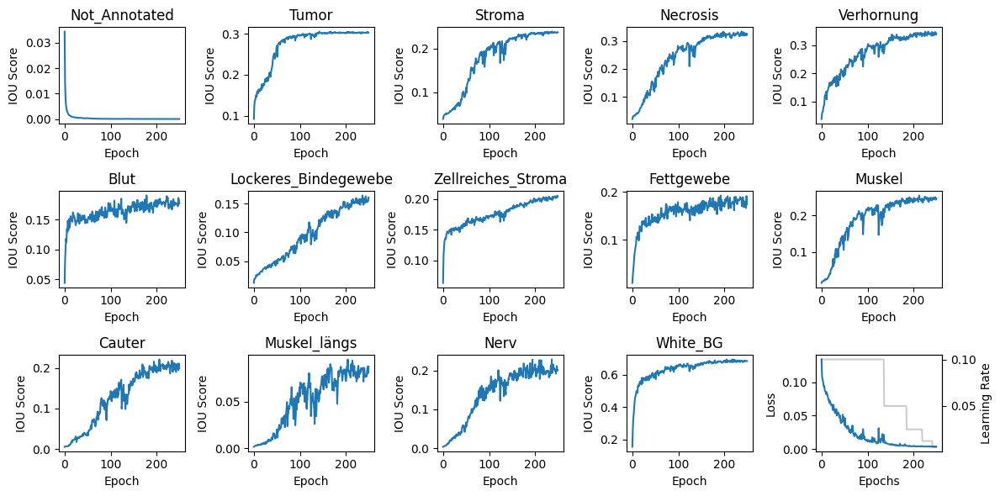

In [62]:
#how was the network on each epoch?

class_names = [
            'Not_Annotated',
            'Tumor',
            'Stroma',
            'Necrosis',
            'Verhornung',
            'Blut',
            'Lockeres_Bindegewebe',
            'Zellreiches_Stroma',
            'Fettgewebe',
            'Muskel',
            'Cauter',
            'Muskel_längs',
            'Nerv',
            'White_BG',
            ]


fig, axes = plt.subplots(3, 5, figsize=(12, 6))
axes = axes.flatten()

for i, class_name in enumerate(class_names):
    metric_name = 'IOU_' + class_name
    axes[i].plot(history.history[metric_name])
    axes[i].set_title(class_name)
    axes[i].set_xlabel('Epoch')
    axes[i].set_ylabel('IOU Score')


axes[14].plot(history.history['loss'], label='loss')
axes[14].set_xlabel('Epochs')
axes[14].set_ylabel('Loss')

# Plot the second dataset
ax2 = axes[14].twinx()

ax2.plot(history.history['lr'], label='lr', color='black',alpha=0.2)
ax2.set_ylabel('Learning Rate')



plt.tight_layout()
plt.savefig('./14class_OF_SGD_WCat.png') 

plt.show()

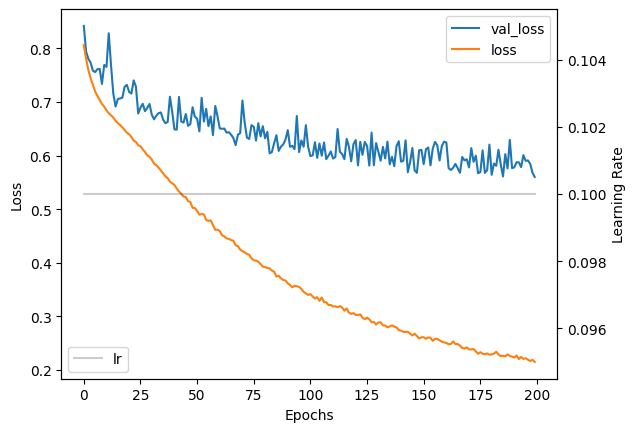

In [18]:
import matplotlib.pyplot as plt

# Create the figure and the first y-axis
fig, ax1 = plt.subplots()

# Plot the first dataset
ax1.plot(history.history['val_loss'], label='val_loss')
ax1.plot(history.history['loss'], label='loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend(loc='upper right')

# Create the second y-axis
ax2 = ax1.twinx()

# Plot the second dataset
ax2.plot(history.history['lr'], label='lr', color='black',alpha=0.2)
ax2.set_ylabel('Learning Rate')
ax2.legend(loc='lower left')

plt.savefig('./32SGDM_loss_1.0.png') 
plt.show()


In [68]:
# Save the weights
# model.save_weights('./weights')
# model.save('./model_SGD_WCat')
#model.save("D:/Hamed/model")
model.save("D:/Hamed/model.h5")

In [20]:
DataGen = DataGenerator(X_test, Y_test, batch_size=len(X_test),aug=0)
a, b =DataGen.__getitem__(0)
score = model.evaluate(a,b)


8/8 [==============================] - 4s 213ms/step - loss: 0.5478 - BG: 0.8292 - IOU_Tumor: 0.4153 - IOU_Stroma: 0.2985 - IOU_Necrosis: 0.2923 - IOU_Verhornung: 0.1888 - IOU_Blut: 0.2719 - IOU_Lockeres_Bindegewebe: 0.0581 - IOU_Zellreiches_Stroma: 0.2258 - IOU_Fettgewebe: 2.0236e-09 - IOU_Muskel: 0.2497 - IOU_Nerv: 0.0529


In [24]:
class_names = [
    
            'BG',
            'Tumor',
            'Stroma',
            'Necrosis',
            'Verhornung',
            'Blut',
            'Lockeres_Bindegewebe',
            'Zellreiches_Stroma',
            'Fettgewebe',
            'Muskel',
            'Nerv']

1/1 [==============================] - 0s 47ms/step


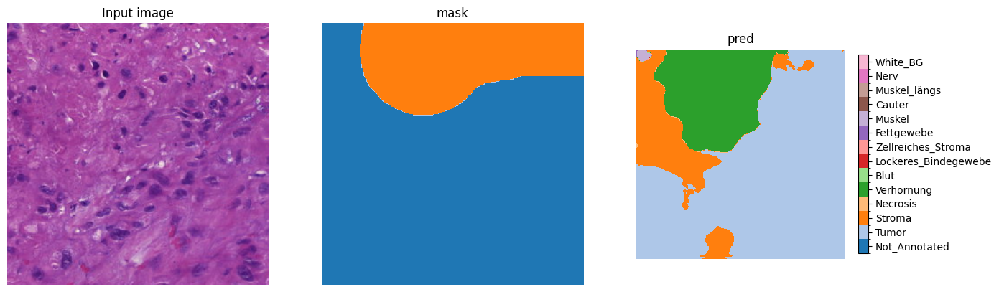

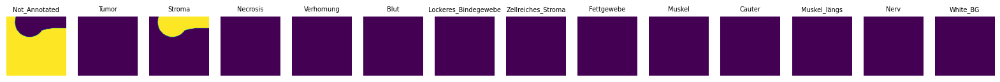

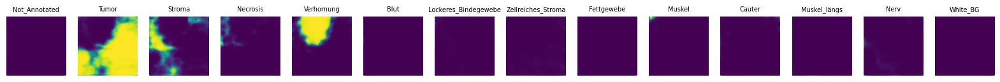

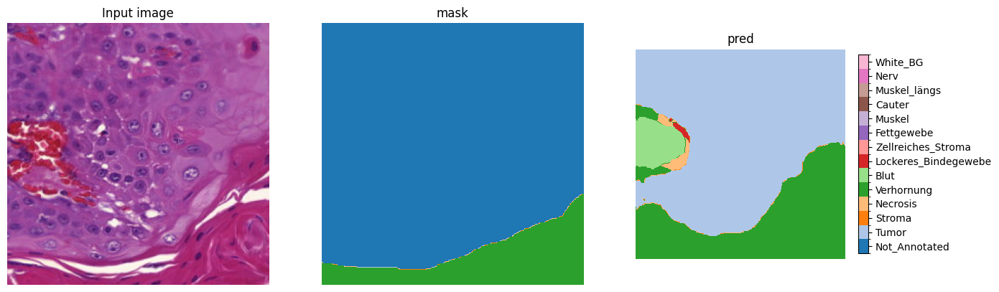

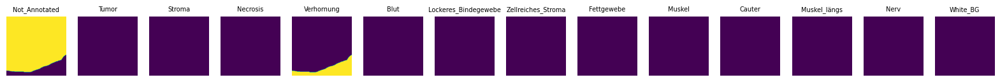

...

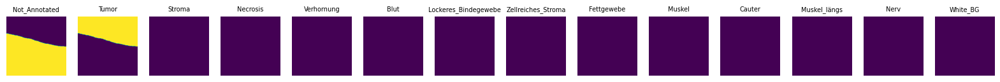

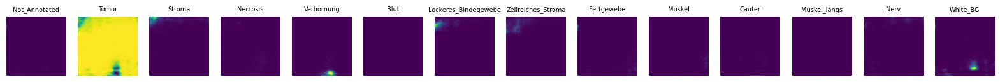

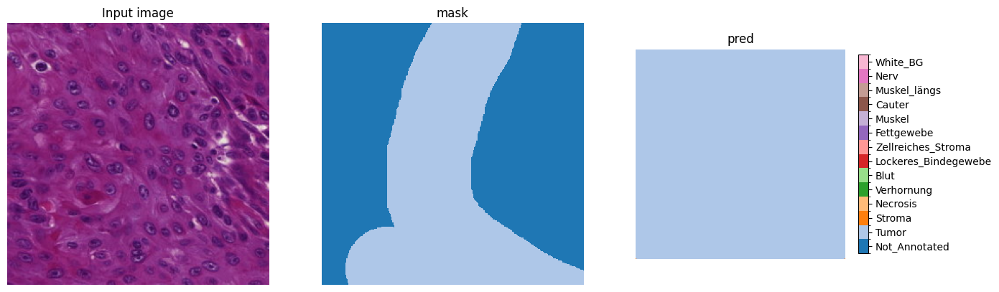

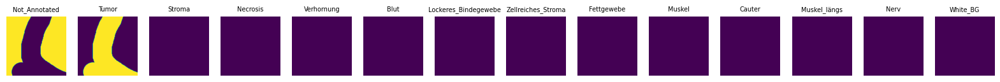

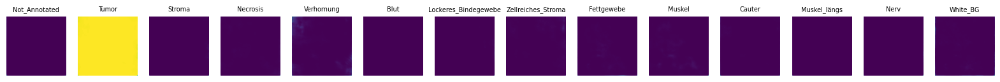

In [69]:
# Normal

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm


DataGen = DataGenerator(X_test,Y_test, batch_size=30, aug=False)
img, mask = DataGen.__getitem__(0)
y_pred = model.predict(img)


for idx in range(np.shape(y_pred)[0]):
    # Plot the input image in the first subplot
   # Create the figure and axis
    fig, ax = plt.subplots(1, 3, figsize=(16, 12))

    # Plot the input image
    ax[0].imshow(img[idx])
    ax[0].set_title('Input image')
    ax[0].axis('off')

    empty = np.zeros((256, 256))
    # Loop through the images and plot them
    ans = np.argmax(mask[idx],axis=2)

    # Create a custom discrete colormap with 13 colors
    cmap = ListedColormap(plt.cm.tab20.colors[:14])
    bounds = np.arange(0, 15) -0.5 # Set boundaries of color segments
    norm = BoundaryNorm(bounds, cmap.N)
    ax[1].axis('off')

    im = ax[1].imshow(ans, cmap=cmap, norm=norm)
    ax[1].set_title('mask')

    empty = np.zeros((256, 256))
    # Loop through the images and plot them
    ans = np.argmax(y_pred[idx],axis=2)

    # Create a custom discrete colormap with 13 colors
    cmap = ListedColormap(plt.cm.tab20.colors[:14])
    ax[2].axis('off')


    im = ax[2].imshow(ans, cmap=cmap, norm=norm)
    ax[2].set_title('pred')

    # Add colorbar next to the second plot
    cbar = plt.colorbar(im, ax=ax[2], ticks=np.arange(0, 14), shrink=0.3)
    cbar.set_ticklabels(class_names)


    ##################################

    # Create the subplots
    fig, axs = plt.subplots(1, 14, figsize=(20, 5))

    # Loop through each subplot
    for i, ax in enumerate(axs.flat):
        ax.imshow(mask[idx][:, :, i])
        ax.axis('off')
        ans = np.mean(mask[idx][:, :, i])
        ax.set_title(f'{class_names[i]}', fontsize=7)

    plt.show()



    ###########################################

    # Create the subplots
    fig, axs = plt.subplots(1, 14, figsize=(20, 5))

    # Loop through each subplot
    for i, ax in enumerate(axs.flat):
        ax.imshow(y_pred[idx][:, :, i])
        ax.axis('off')
        ans = np.mean(y_pred[idx][:, :, i])
        ax.set_title(f'{class_names[i]}', fontsize=7)

    plt.show()
